<a href="https://colab.research.google.com/github/pushan9/Colab-notebook/blob/main/Generating_Fake_Images_with_Generative_Adversarial_Networks_(GANs).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# __Demo: Generating Fake Images with Generative Adversarial Networks (GANs)__

# __Steps to Perform__

Step 1: Import the Necessary Libraries

Step 2: Load and Preprocess the Data

Step 3: Build the Generator and Discriminator

Step 4: Compile the Models

Step 5: Train the Models

Step 6: Execute the Training

Step 7: Generate New Images and Evaluate the Model's Performance



# __Step 1: Import the Necessary Libraries__

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten
from tensorflow.keras.models import Sequential
import numpy as np

# We use this dataset as real images to train the GAN.
# The generator will learn to create fake images that look like MNIST digits.
# The discriminator will learn to distinguish between real MNIST digits and fake ones.

# __Step 2: Load and Preprocess the Data__

- Load the MNIST dataset and preprocess it.
- Preprocessing involves normalizing the data that can improve models' performance.

In [ ]:
# Load MNIST data
(X_train, _), (_, _) = mnist.load_data()
# It returns two tuples:
# (X_train, y_train) → the training images and their labels.
# (X_test, y_test) → the test images and their labels
# you see underscores _ used — that means we don’t care about the labels (y_train, y_test) or test data.
# X_train contains 60,000 grayscale images, each 28×28 pixels.
# We ignore the labels because GANs are unsupervised — they don’t need “which number is this,” they only learn the pattern of images.
# In this GAN, X_train acts as the “real” dataset that the discriminator will see.
# The generator will later try to create similar-looking fake images to fool it.

In [ ]:
# Normalize to between -1 and 1
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
# np.float32 - integers to floating-point numbers (required for TensorFlow)
# -127.5 and /127.5 - scale pixel values from [0, 255] to [-1, 1]
# Normalization helps neural networks train faster and perform better.
# Why not scale between 0 and 1?
# -1 to 1 is symmetric around zero, which can help certain activation functions (like tanh) work better.

X_train = np.expand_dims(X_train, axis=3)
# np.expand_dims() adds one more dimension (a “channel” dimension) to the dataset.
# Original shape: (60000, 28, 28)
# New shape: (60000, 28, 28, 1)
# The last dimension (1) indicates that these are grayscale images (1 channel).
# If these were RGB images, this dimension would be 3 (for red, green, blue).
# >Why?
# Because TensorFlow expects images in 4D tensors with the format:
# (batch_size, height, width, channels)
# Since MNIST images are grayscale, they have 1 channel — hence axis=3 adds that last dimension.

# __Step 3: Build the Generator and Discriminator__

- Define the generator and discriminator models.
- Generator takes a random noise vector as input and outputs an image.
- Discriminator takes an image as input and outputs the probability of the image being real.

In [ ]:
# In a GAN (Generative Adversarial Network), we have two models competing with each other:

# 1. Generator (G):
# Takes random noise as input and tries to create fake images that look real.

# 2. Discriminator (D):
# Looks at images (both real and fake) and tries to decide whether each image is real or fake.

# Both models are trained together — the generator gets better at fooling the discriminator, while the discriminator gets better at catching the fakes.

In [ ]:
# Generator
def create_generator():
    model = Sequential()
    model.add(Dense(256, input_dim=100, activation='relu')) # input_dim=100 means it expects a 100-dimensional random noise vector as input.
    model.add(Dense(512, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(784, activation='tanh')) # This is the output layer. Each MNIST image has 28×28 = 784 pixels, so the output has 784 neurons. The generator outputs a 1D array of 784 values, each representing a pixel intensity between -1 and 1.
    model.add(Reshape((28, 28, 1)))
    return model

# Discriminator
def create_discriminator():
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28, 1)))
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(512, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(1, activation='sigmoid')) # The output layer has 1 neuron with a sigmoid activation function. This outputs a probability between 0 and 1, indicating whether the input image is real (close to 1) or fake (close to 0).
    return model

### Generator Summary

| Layer   | Units | Activation | Purpose                    |
| ------- | ----- | ---------- | -------------------------- |
| Dense   | 256   | ReLU       | Learn early features       |
| Dense   | 512   | ReLU       | Deepen representation      |
| Dense   | 1024  | ReLU       | Complex feature learning   |
| Dense   | 784   | tanh       | Output fake image (1D)     |
| Reshape | —     | —          | Convert to (28×28×1) image |


### Discriminator Summary

| Layer   | Units | Activation | Purpose                      |
| ------- | ----- | ---------- | ---------------------------- |
| Flatten | —     | —          | Convert 2D image → 1D vector |
| Dense   | 1024  | ReLU       | Extract image features       |
| Dense   | 512   | ReLU       | Deep feature refinement      |
| Dense   | 256   | ReLU       | Compress learned features    |
| Dense   | 1     | Sigmoid    | Predict real (1) or fake (0) |


# __Step 4: Compile the Models__

- Compile the models, which involves defining the loss function and the optimizer.
- The loss function evaluates the model's performance, while the optimizer aims to minimize the loss.

In [ ]:
from tensorflow.keras.models import Sequential, Model

# Create and compile the discriminator
discriminator = create_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer='adam')

# Create and compile the generator
generator = create_generator()
generator.compile(loss='binary_crossentropy', optimizer='adam')

# Create and compile the combined model
discriminator.trainable = False
# Before we build the full GAN (Generator + Discriminator),
# we freeze the discriminator’s weights temporarily.

gan_input = Input(shape=(100,))
x = generator(gan_input)
gan_output = discriminator(x)
gan = Model(inputs=gan_input, outputs=gan_output)
gan.compile(loss='binary_crossentropy', optimizer='adam')

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


| Component         | What It Does                                   | Trained When          |
| ----------------- | ---------------------------------------------- | --------------------- |
| **Discriminator** | Learns to classify real (1) vs fake (0) images | Separately            |
| **Generator**     | Learns to make fake images that look real      | Inside combined GAN   |
| **Combined GAN**  | Connects both (Generator → Discriminator)      | Trains Generator only |


# __Step 5: Train the Models__

- Train the model, which involves feeding data into the models and adjusting the weights of the models based on the output.
- The primary aim is for the generator to create images indistinguishable from real images by the discriminator.

In [ ]:
def train(epochs=1, batch_size=128):
    # Load the data
    (X_train, _), (_, _) = mnist.load_data()
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for the batch size and the test size
    # Creates labels for training:
    # y_train_ones → label “1” for real images.
    # y_train_zeros → label “0” for fake images.
    # y_test_ones → label “1” for testing generator (when we want to check if fake images can fool the discriminator).
    y_train_ones = np.ones((batch_size, 1))
    y_train_zeros = np.zeros((batch_size, 1))
    y_test_ones = np.ones((100, 1))

    # Start training
    for e in range(epochs):
        for i in range(X_train.shape[0] // batch_size): # Iterates batch-by-batch through MNIST
            # Train Discriminator weights
            discriminator.trainable = True # Enables discriminator learning

            # Real samples
            X_batch = X_train[i*batch_size:(i+1)*batch_size] # Takes one batch of real images from MNIST. eg: 0 to 128, then 128 to 256, etc.
            d_loss_real = discriminator.train_on_batch(x=X_batch, y=y_train_ones * (1 - 0.1 * np.random.rand(batch_size, 1)))

            # Fake Samples
            z_noise = np.random.normal(loc=0, scale=1, size=(batch_size, 100))
            X_fake = generator.predict_on_batch(z_noise)
            d_loss_fake = discriminator.train_on_batch(x=X_fake, y=y_train_zeros)

            # Discriminator loss
            d_loss = 0.5 * (d_loss_real + d_loss_fake) # calculates the average loss of the discriminator on real and fake images.
            # If d_loss is low → discriminator is doing well.
            # If it’s high → discriminator is getting fooled more often.

            # Train Generator weights
            discriminator.trainable = False # Freezes discriminator weights so only generator learns
            g_loss = gan.train_on_batch(x=z_noise, y=y_train_ones) # Noise → fake image → discriminator. Generator is rewarded if discriminator predicts “real”

            print(f'Epoch: {e+1}, Batch: {i}, D Loss: {d_loss}, G Loss: {g_loss}')

# __Step 6: Execute the Training__

In [ ]:
# Call the train function - This code took 10m 36s to run on my MacBook M3 Pro
train(epochs=50, batch_size=128)

Epoch: 1, Batch: 0, D Loss: 0.7911192178726196, G Loss: 0.600623369216919
Epoch: 1, Batch: 1, D Loss: 0.994278073310852, G Loss: 0.4987430274486542
Epoch: 1, Batch: 2, D Loss: 1.0162112712860107, G Loss: 0.6934330463409424
Epoch: 1, Batch: 3, D Loss: 1.0536065101623535, G Loss: 0.7091245651245117
Epoch: 1, Batch: 4, D Loss: 0.9524055123329163, G Loss: 0.729489803314209
Epoch: 1, Batch: 5, D Loss: 0.8842589855194092, G Loss: 0.8467421531677246
Epoch: 1, Batch: 6, D Loss: 0.8146488666534424, G Loss: 1.0350695848464966
Epoch: 1, Batch: 7, D Loss: 0.7723582983016968, G Loss: 1.1292630434036255
Epoch: 1, Batch: 8, D Loss: 0.7210375070571899, G Loss: 1.2068290710449219
Epoch: 1, Batch: 9, D Loss: 0.6811725497245789, G Loss: 1.3561720848083496
Epoch: 1, Batch: 10, D Loss: 0.6404303312301636, G Loss: 1.5435118675231934
Epoch: 1, Batch: 11, D Loss: 0.6059414744377136, G Loss: 1.6767410039901733
Epoch: 1, Batch: 12, D Loss: 0.5725504159927368, G Loss: 1.7882529497146606
Epoch: 1, Batch: 13, D Lo

**Notes:**
- Epochs parameter determines how many times the learning algorithm will work through the entire training dataset.
- The `batch_size` is the number of samples that will be propagated through the network at a time.

# __Step 7: Generate New Images and Evaluate the Model's Performance__

- Generate new images and evaluate the performance of the GAN.
- Generate a random noise vector and feed it into the trained generator to create new images.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


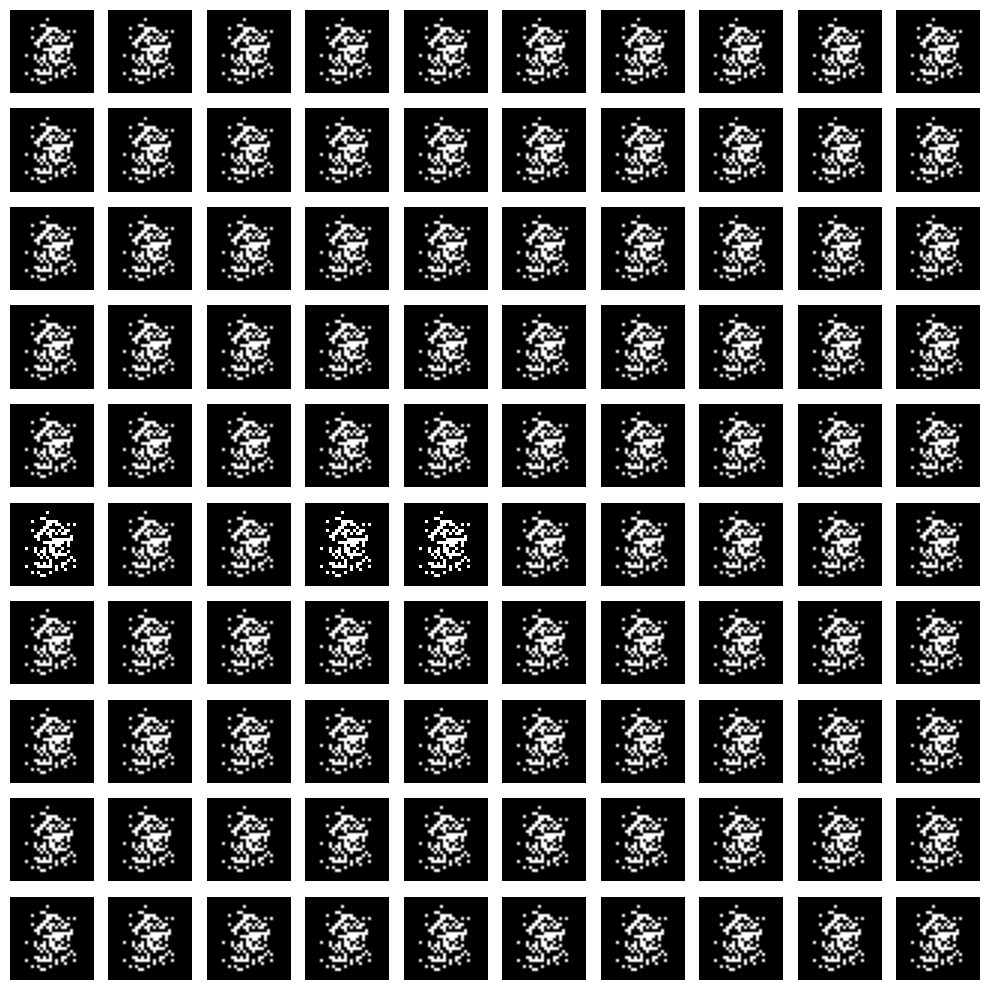

In [ ]:
import matplotlib.pyplot as plt
# Generate random noise as an input to initialize the generator
random_noise = np.random.normal(0,1, [100, 100])

# Generate the images from the noise
generated_images = generator.predict(random_noise) # Shape of output: (100, 28, 28, 1) i.e. Each image: 28x28 pixels with 1 channel (grayscale)

# Visualize the generated images
plt.figure(figsize=(10,10))
for i in range(generated_images.shape[0]):
    plt.subplot(10, 10, i+1)
    plt.imshow(generated_images[i, :, :, 0], cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

- The resulting plot shows the images generated by the GAN model.

**Notes:**

The output effectively demonstrates how model can generate images resembling handwritten digit 8. However, there is room for improving the quality of these images.

In [ ]:
# Recommendation in order to improve the quality of generated images:
# 1. Train Longer: Start small (5–10 epochs) and gradually increase. You’ll begin to see variety appear after ~10–20 epochs.

# 2. Use Different Learning Rates:
# Try a slightly slower discriminator:
# from tensorflow.keras.optimizers import Adam
# discriminator.compile(loss='binary_crossentropy',
#                       optimizer=Adam(learning_rate=0.0002, beta_1=0.5))
# generator.compile(loss='binary_crossentropy',
#                   optimizer=Adam(learning_rate=0.0002, beta_1=0.5))

# 3. Use Convolutional Layers (for better image structure):
# Upgrade your architecture to a Deep Convolutional GAN (DCGAN):
# Replace Dense layers with Conv2DTranspose in the generator.
# Replace Flatten with Conv2D layers in the discriminator.
# This helps capture edges and patterns, leading to realistic digits.

# 4. Add Noise or Label Smoothing:
# You can also:
# Add dropout layers in discriminator.
# Shuffle batches during training.
# These help stabilize learning and reduce collapse.

# Visualize Intermediate Results:
# After every few epochs, visualize samples to track progress:
# if i % 100 == 0:
#     display_generated_images(generator)

In [ ]:
# Lets try training for more epochs and see the results!

# Call the train function - This code took 10m 36s to run on my MacBook M3 Pro
train(epochs=500, batch_size=128)

Epoch: 1, Batch: 0, D Loss: 0.1046314686536789, G Loss: 21.436988830566406
Epoch: 1, Batch: 1, D Loss: 0.10463108867406845, G Loss: 21.437318801879883
Epoch: 1, Batch: 2, D Loss: 0.1046307161450386, G Loss: 21.437644958496094
Epoch: 1, Batch: 3, D Loss: 0.1046304777264595, G Loss: 21.437973022460938
Epoch: 1, Batch: 4, D Loss: 0.10463021695613861, G Loss: 21.438302993774414
Epoch: 1, Batch: 5, D Loss: 0.1046304777264595, G Loss: 21.43865203857422
Epoch: 1, Batch: 6, D Loss: 0.1046304851770401, G Loss: 21.43902015686035
Epoch: 1, Batch: 7, D Loss: 0.10463042557239532, G Loss: 21.439393997192383
Epoch: 1, Batch: 8, D Loss: 0.10463012009859085, G Loss: 21.439756393432617
Epoch: 1, Batch: 9, D Loss: 0.10462959110736847, G Loss: 21.440086364746094
Epoch: 1, Batch: 10, D Loss: 0.1046295315027237, G Loss: 21.440397262573242
Epoch: 1, Batch: 11, D Loss: 0.10462931543588638, G Loss: 21.440702438354492
Epoch: 1, Batch: 12, D Loss: 0.10462920367717743, G Loss: 21.441015243530273
Epoch: 1, Batch: 

In [ ]:
import matplotlib.pyplot as plt
# Generate random noise as an input to initialize the generator
random_noise = np.random.normal(0,1, [100, 100])

# Generate the images from the noise
generated_images = generator.predict(random_noise)

# Visualize the generated images
plt.figure(figsize=(10,10))
for i in range(generated_images.shape[0]):
    plt.subplot(10, 10, i+1)
    plt.imshow(generated_images[i, :, :, 0], cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

# __Conclusion__

In this demo, you have successfully implemented a GAN to generate images resembling handwritten digits, focusing on the MNIST dataset. The process involved constructing and training a generator and a discriminator. The results were promising, showcasing the GAN's ability to create images similar to the digit **8**, but also highlighted the need for further improvements in image quality.